# TP 4

### Enunciado

Para las imágenes suministradas:
1. Implementar extractor de características LBP básico (sin uniformidad, 8 vecinos)
2. Realizar el histograma de características LBP de la imagen.
3. Comparar los histogramas.

In [1]:
#%matplotlib
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import cm
from os import walk

In [2]:
def collect_image_filenames(img_path):
    img_filenames = []
    for (dirpath, dirnames, filenames) in walk(img_path):
        img_filenames.extend(filenames)
        break
    return list(map(lambda x: img_path+x,img_filenames))

In [3]:
IMAGE_PATH = "./data/"
testrgb_img_filenames = collect_image_filenames(img_path=IMAGE_PATH)
testrgb_img_filenames

test_images = []
for i in range(0, len(testrgb_img_filenames)):
    image_filename = testrgb_img_filenames[i]
    print(image_filename)
    img = cv2.imread(image_filename)[...,::-1] # fix colors
    test_images.append(img)    
    #print(img.shape)
    #print("Average Color: ", img[:,:,0].mean(),img[:,:,1].mean(),img[:,:,2].mean())
    #print("Max Color: ", img[:,:,0].max(),img[:,:,1].max(),img[:,:,2].max())

./data/cielo.png
(300, 300, 3)
./data/piedras2.png
(300, 300, 3)
./data/rbt_scn3_focus.png
(484, 464, 3)
./data/rbt_scn2.png
(790, 1382, 3)
./data/piedras1.png
(300, 300, 3)
./data/oveja1.png
(299, 299, 3)
./data/rbt_scn4.png
(718, 1208, 3)
./data/ladrillos1.png
(290, 299, 3)
./data/rbt_scn4_focus.png
(370, 344, 3)
./data/rbt_scn3.png
(712, 1544, 3)
./data/oveja2.png
(300, 300, 3)
./data/rbt_scn1_focus.png
(564, 580, 3)
./data/ladrillos2.png
(298, 299, 3)


In [25]:
def lbp(x):
    lbp_code = 0
    visit_list = [(0,0),(0,-1), (1,-1), (1,0),(1,1), (0,1),(-1,1),(-1,0),(-1,-1)]
    for i in range(len(visit_list)-1):
        cell_value = 1 if (x[visit_list[i]]-x[visit_list[i+1]]) >= 0  else 0
        lbp_code |= cell_value << i
    return lbp_code

def get_lbp_texture(x):
    if x.ndim> 2:
        gray = cv2.cvtColor(x,cv2.COLOR_BGR2GRAY).astype(np.float32)
    else:
        gray = x.astype(np.float32)
    lbp_texture = np.zeros( (x.shape[0]-2,x.shape[1]-2) )
    #print(x.shape,lbp_texture.shape)
    for iy in range(1,gray.shape[0]-1):
        for ix in range(1,gray.shape[1]-1):
            lbp_code = lbp(gray[iy-1:iy+2,ix-1:ix+2])
            lbp_texture[iy-1,ix-1] = lbp_code
            #print(lbp_code)
    return lbp_texture.astype(np.uint8)

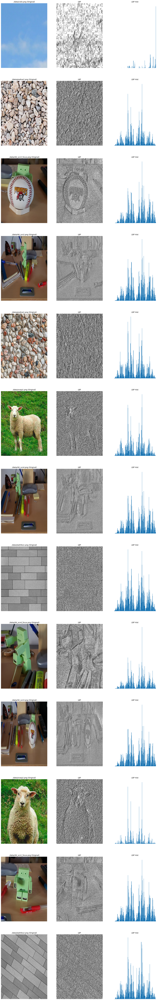

In [26]:
n_images = len(test_images)
fig, ax = plt.subplots(n_images,3,figsize=(20,7*n_images)) 
for i in range(n_images):
    ax[i][0].set_title(f"{testrgb_img_filenames[i]} (Original)")
    ax[i][0].imshow(test_images[i],aspect='auto')
    ax[i][0].axis('off')
    ax[i][1].set_title("LBP")
    lbp_img = get_lbp_texture(test_images[i])
    ax[i][1].imshow(lbp_img,aspect='auto',cmap='gray', vmin=0, vmax=255)
    ax[i][1].axis('off')
    ax[i][2].set_title("LBP Hist")
    ax[i][2].hist(lbp_img.ravel(),256,[0,256]); 
    ax[i][2].axis('off')
    
plt.show()

## Comparación de histogramas

TODO